# London Road Network

Data source: https://osdatahub.os.uk/downloads/open/OpenRoads

In [1]:
from os import listdir, path

import shapely
import pandas as pd
import geopandas as gpd

from lets_plot import *
from lets_plot.geo_data import *

The geodata is provided by © OpenStreetMap contributors and is made available here under the Open Database License (ODbL).



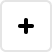
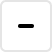
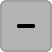
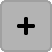
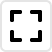
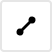
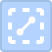
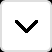
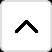
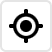

In [2]:
LetsPlot.setup_html()

In [3]:
INPUT_DIR = "data"
ROAD_LENGTH_THRESHOLD = 150

In [4]:
def data_files(input_dir):
    return {
        filename[:2]: path.join(input_dir, filename)
        for filename in listdir(input_dir)
        if filename[3:] == "RoadLink.shp"
    }

def load_dataset(fullpath, outer_geom=None):
    gdf = gpd.read_file(fullpath)
    gdf = gdf[["geometry", "length"]] # remove extra columns
    gdf = gdf.to_crs(4326) # transform coordinates to EPSG:4326
    if outer_geom is not None:
        gdf = gdf[gdf["geometry"].intersects(outer_geom)] # restrict paths by outer geometry
    gdf["geometry"] = gdf["geometry"].apply(
        lambda v: shapely.wkb.loads(shapely.wkb.dumps(v, output_dimension=2))
    ) # remove extra third coordinate (that is always 0)
    return gdf

def get_gdf(input_dir, *, outer_geom=None, input_slice=None):
    if input_slice is None:
        data_files_slice = data_files(input_dir)
    else:
        data_files_slice = {k: v for k, v in data_files(input_dir).items() if k in input_slice}
    return gpd.GeoDataFrame(pd.concat([
        load_dataset(fullpath, outer_geom).assign(id=file_id)
        for file_id, fullpath in data_files_slice.items()
    ], ignore_index=True))

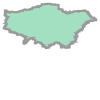

In [5]:
london_geometry = geocode_counties("London").get_boundaries().iloc[0].geometry
london_geometry

In [6]:
roads_gdf = get_gdf(INPUT_DIR, outer_geom=london_geometry, input_slice=["TL", "TQ"])
print(roads_gdf.shape)
roads_gdf.head()

(210650, 3)


,geometry,length,id
0,"LINESTRING (-0.01141 51.68677, -0.01135 51.686...",1453,TL
1,"LINESTRING (-0.04851 51.68268, -0.04826 51.682...",119,TL
2,"LINESTRING (-0.04818 51.68363, -0.04754 51.683...",365,TL
3,"LINESTRING (-0.04935 51.68398, -0.04955 51.683...",106,TL
4,"LINESTRING (-0.03301 51.68229, -0.03323 51.682...",669,TL


In [7]:
cropped_gdf = roads_gdf[roads_gdf["length"] > ROAD_LENGTH_THRESHOLD].sort_values(by="length")

In [8]:
ggplot() + \
    geom_path(aes(color="length"), map=cropped_gdf) + \
    scale_color_gradient(low="#8856a7", high="#e0ecf4", \
                         trans="log10", guide='none') + \
    ggsize(800, 600) + \
    ggtitle("London road network") + \
    theme_classic() + theme(axis='blank') + flavor_high_contrast_dark()